# Import needed modules

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# 1. Base Model

In [2]:
#Import packages used here:

import numpy as np
import os
import random
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import image_dataset_from_directory
from keras.preprocessing.image import ImageDataGenerator

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# setup my directories
train_directory = '../input/100-bird-species/train'
test_directory = '../input/100-bird-species/test'
val_directory = '../input/100-bird-species/valid'

In [4]:
categories = os.listdir(train_directory) # list the names of the categories that in my data
print(str(len(categories)),'CATEGORIES are ', categories)

category_count = len(categories)
# we will use "category_count" as the number of classes that we need to classify instead of typing 525 because the data is continuously increasing

525 CATEGORIES are  ['DALMATIAN PELICAN', 'BLACK BREASTED PUFFBIRD', 'WATTLED CURASSOW', 'AMERICAN WIGEON', 'CARMINE BEE-EATER', 'GAMBELS QUAIL', 'UMBRELLA BIRD', 'AMERICAN KESTREL', 'AMERICAN GOLDFINCH', 'BLUE GROSBEAK', 'PALM NUT VULTURE', 'DUSKY LORY', 'AUCKLAND SHAQ', 'BLACK THROATED WARBLER', 'YELLOW CACIQUE', 'STRIPPED SWALLOW', 'VERMILION FLYCATHER', 'CAPE MAY WARBLER', 'RED TAILED HAWK', 'GURNEYS PITTA', 'INDIAN ROLLER', 'SNOW GOOSE', 'GREEN WINGED DOVE', 'AZURE TANAGER', 'GREEN MAGPIE', 'BANDED BROADBILL', 'AFRICAN PYGMY GOOSE', 'INDIGO FLYCATCHER', 'GREY PLOVER', 'TOUCHAN', 'HYACINTH MACAW', 'HARLEQUIN DUCK', 'ABYSSINIAN GROUND HORNBILL', 'CALIFORNIA QUAIL', 'BALD IBIS', 'WOOD THRUSH', 'RUBY THROATED HUMMINGBIRD', 'INDIGO BUNTING', 'ALBERTS TOWHEE', 'SORA', 'HOODED MERGANSER', 'ROSEATE SPOONBILL', 'CAPE ROCK THRUSH', 'BLUE COAU', 'CALIFORNIA CONDOR', 'BORNEAN PHEASANT', 'BARN SWALLOW', 'TAIWAN MAGPIE', 'SPLENDID WREN', 'RED BILLED TROPICBIRD', 'BLACK THROATED BUSHTIT', 'CHINE

In [5]:
augmented_gen = ImageDataGenerator(
    rescale=1./255, 
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest') 

general_datagen = ImageDataGenerator(rescale = 1./255) # for training, validation and testing data

train_generator = general_datagen.flow_from_directory(
    train_directory,
    target_size = (224, 224),
    batch_size = 32
)
valid_generator = general_datagen.flow_from_directory(
    val_directory,
    target_size = (224, 224),
    batch_size = 32
)
test_generator = general_datagen.flow_from_directory(
    test_directory,
    target_size = (224, 224),
    batch_size = 32
)

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


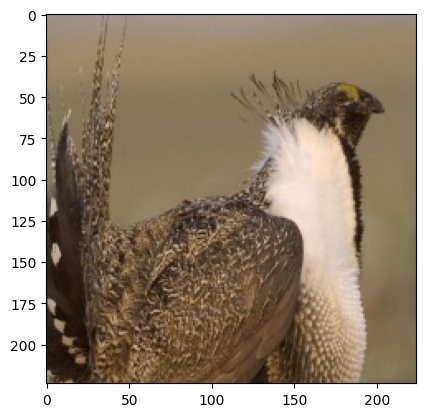

In [6]:
# ploting a sample from my data
def plot_image(generator):
    images_in_batch = next(generator) # images_in_batch will output (batch_size, height, width, n_channels)
    img = images_in_batch[0][0] # img will output (height, width, n_chennels)
    
    plt.imshow(img)

plot_image(train_generator)

In [7]:
# i will be using it to determine steps_per_epoch in my models.
train_groups = len(train_generator) 
valid_groups = len(valid_generator) # validation_step

print(f"Train groups: {train_groups}")
print(f"Validation groups: {valid_groups}")

Train groups: 2645
Validation groups: 83


**Build base model**

In [8]:
# convolution layer that we will be used in out model i added batch normalization to accelerate the model and for generalization
def conv_layer(inputs, filters, kernel_size=3, padding="valid"):
    x = layers.Conv2D(filters = filters, kernel_size = kernel_size, padding = padding, use_bias = False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    return x
# pooling layer i added dropout cause it help my model to reduce the overfitting
def pooling_layer(inputs, pool_size = 2, dropout_rate=0.5):
    x = layers.MaxPooling2D(pool_size = pool_size)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(dropout_rate)(x)
    
    return x

# this dense layer i will not only use it for my base model i will use it in the pretrained model too
def dense_layer(inputs, out, dropout_rate = 0.5):
    x = layers.Dense(out)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Dropout(dropout_rate)(x)
    
    return x

In [9]:
# in first my model was only two blocks gradually from 64 to 128 filters and gives me an accuracy of 55%
# so i added the dropouts and the batch normalization that above and set my filters to 64 and to make it better i added another block
# and changes in the dense layer before my output and play with my optimizer, the model gives me an acc of +75& on the test data
# i stoped then, with more to add to my arch to make it better, i can add residual connection to it and play with things but i stopped cause it take time and the gpu

keras.backend.clear_session()

inputs = keras.Input(shape = (224, 224, 3))

x = conv_layer(inputs, 64, padding = "same")  # 224x224
x = conv_layer(x, 64)                         # 222x222
x = pooling_layer(x)                          # 111x111

x = conv_layer(x, 64, padding = "same")       # 111x111
x = conv_layer(x, 64)                         # 109x109
x = pooling_layer(x)                          # 54x54

x = conv_layer(x, 64, padding = "same")       # 54x54
x = conv_layer(x, 64)                         # 52X52
x = pooling_layer(x)                          # 26x26

x = conv_layer(x, 64, padding = "same")       # 26x26

x = layers.Flatten()(x)                       # 26*26*64

x = dense_layer(x, 512)

outputs = layers.Dense(category_count, activation = "softmax")(x)

base_model = keras.Model(inputs, outputs)

base_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1728      
                                                                 
 batch_normalization (Batch  (None, 224, 224, 64)      256       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 224, 224, 64)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 222, 222, 64)      36864     
                                                                 
 batch_normalization_1 (Bat  (None, 222, 222, 64)      256       
 chNormalization)                                            

In [13]:
base_model.compile(optimizer =keras.optimizers.Adam(lr = 0.001),
               loss = 'categorical_crossentropy',
               metrics = ['accuracy'])
#fit model
history = base_model.fit( 
    train_generator,
    steps_per_epoch = train_groups,
    epochs = 10, # adding more epochs will increase the acc like 1% or 2%
    validation_data = valid_generator,
    validation_steps = valid_groups,
    verbose = 1)

Epoch 1/10


2023-11-17 06:31:16.373970: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2645/2645 [==============================] - 493s 184ms/step - loss: 1.7268 - accuracy: 0.5857 - val_loss: 1.4065 - val_accuracy: 0.6636
Epoch 2/10
2645/2645 [==============================] - 489s 185ms/step - loss: 1.4932 - accuracy: 0.6323 - val_loss: 1.2245 - val_accuracy: 0.7006
Epoch 3/10
2645/2645 [==============================] - 488s 185ms/step - loss: 1.2236 - accuracy: 0.6857 - val_loss: 1.1632 - val_accuracy: 0.7086
Epoch 4/10
2645/2645 [==============================] - 488s 184ms/step - loss: 1.0099 - accuracy: 0.7307 - val_loss: 1.2101 - val_accuracy: 0.7010
Epoch 5/10
2645/2645 [==============================] - 488s 184ms/step - loss: 0.8364 - accuracy: 0.7703 - val_loss: 1.1214 - val_accuracy: 0.7269
Epoch 6/10
2645/2645 [==============================] - 488s 184ms/step - loss: 0.6962 - accuracy: 0.8042 - val_loss: 1.1595 - val_accuracy: 0.7242
Epoch 7/10
2645/2645 [==============================] - 487s 184ms/step - loss: 0.6018 - accuracy: 0.8265 - val_loss: 1.224

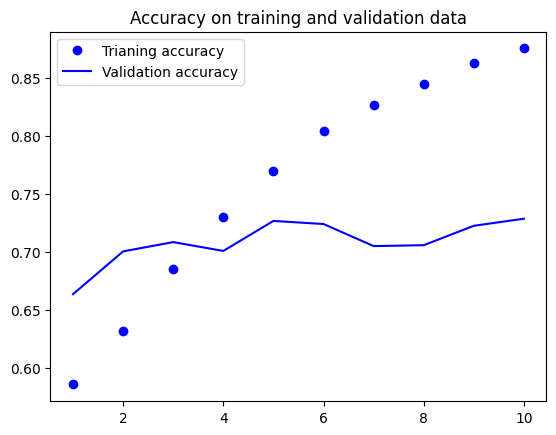

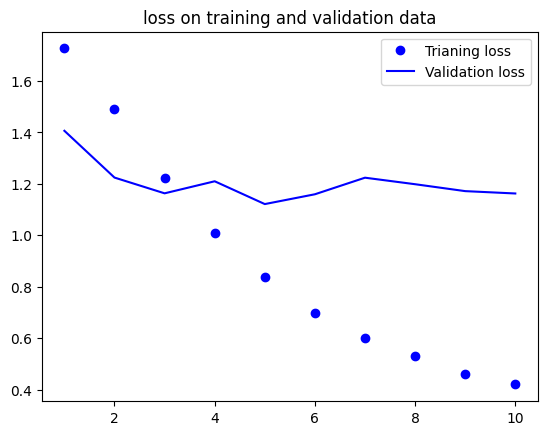

In [14]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]

loss = history.history["loss"]
val_loss = history.history["val_loss"]

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, accuracy, "bo", label = "Trianing accuracy")
plt.plot(epochs, val_accuracy, "b-", label = "Validation accuracy")
plt.title("Accuracy on training and validation data")
plt.legend()
plt.figure()

plt.plot(epochs, loss, "bo", label = "Trianing loss")
plt.plot(epochs, val_loss, "b-", label = "Validation loss")
plt.title("loss on training and validation data")
plt.title("loss on training and validation data")
plt.legend()
plt.show()

# 2. Trainfer Learning with MobileNet

In [16]:
import numpy as np 
import pandas as pd 
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, GlobalAveragePooling2D, Dropout, Flatten
from tensorflow.keras.applications import VGG16
import matplotlib.pyplot as plt
import seaborn as sns

In [17]:
train_ds="/kaggle/input/100-bird-species/train"
test_ds="/kaggle/input/100-bird-species/test"
validation_ds="/kaggle/input/100-bird-species/valid"

**Data preprocessing**

In [18]:
os.listdir('/kaggle/input/100-bird-species/train')

['DALMATIAN PELICAN',
 'BLACK BREASTED PUFFBIRD',
 'WATTLED CURASSOW',
 'AMERICAN WIGEON',
 'CARMINE BEE-EATER',
 'GAMBELS QUAIL',
 'UMBRELLA BIRD',
 'AMERICAN KESTREL',
 'AMERICAN GOLDFINCH',
 'BLUE GROSBEAK',
 'PALM NUT VULTURE',
 'DUSKY LORY',
 'AUCKLAND SHAQ',
 'BLACK THROATED WARBLER',
 'YELLOW CACIQUE',
 'STRIPPED SWALLOW',
 'VERMILION FLYCATHER',
 'CAPE MAY WARBLER',
 'RED TAILED HAWK',
 'GURNEYS PITTA',
 'INDIAN ROLLER',
 'SNOW GOOSE',
 'GREEN WINGED DOVE',
 'AZURE TANAGER',
 'GREEN MAGPIE',
 'BANDED BROADBILL',
 'AFRICAN PYGMY GOOSE',
 'INDIGO FLYCATCHER',
 'GREY PLOVER',
 'TOUCHAN',
 'HYACINTH MACAW',
 'HARLEQUIN DUCK',
 'ABYSSINIAN GROUND HORNBILL',
 'CALIFORNIA QUAIL',
 'BALD IBIS',
 'WOOD THRUSH',
 'RUBY THROATED HUMMINGBIRD',
 'INDIGO BUNTING',
 'ALBERTS TOWHEE',
 'SORA',
 'HOODED MERGANSER',
 'ROSEATE SPOONBILL',
 'CAPE ROCK THRUSH',
 'BLUE COAU',
 'CALIFORNIA CONDOR',
 'BORNEAN PHEASANT',
 'BARN SWALLOW',
 'TAIWAN MAGPIE',
 'SPLENDID WREN',
 'RED BILLED TROPICBIRD',
 'B

In [19]:
batch_size=32
img_size=224

In [20]:
train_datagen = ImageDataGenerator(rescale=1/255.,
                             zoom_range=0.2,
                            width_shift_range=0.2,height_shift_range=0.2
                             )

val_datagen = ImageDataGenerator(rescale=1/255.)

test_datagen = ImageDataGenerator(rescale=1/255.)

train_generator = train_datagen.flow_from_directory(train_ds,  
                                                target_size=(img_size, img_size), 
                                                batch_size=batch_size,
                                                shuffle=True,
                                                class_mode='categorical')  

validation_generator = val_datagen.flow_from_directory(validation_ds,
                                                    target_size=(img_size, img_size),
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(test_ds,
                                                    target_size=(img_size, img_size),
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    class_mode='categorical')

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [21]:
train_generator[0][0].shape

(32, 224, 224, 3)

In [22]:
img= train_generator[0]
print(img)

(array([[[[9.75770712e-01, 8.90196145e-01, 5.30111730e-01],
         [9.75770712e-01, 8.90196145e-01, 5.30111730e-01],
         [9.75770712e-01, 8.90196145e-01, 5.30111730e-01],
         ...,
         [9.56862807e-01, 8.78431439e-01, 6.04621530e-01],
         [9.56862807e-01, 8.78431439e-01, 6.04621530e-01],
         [9.56862807e-01, 8.78431439e-01, 6.04621530e-01]],

        [[9.80392218e-01, 8.90196145e-01, 5.25490224e-01],
         [9.80392218e-01, 8.90196145e-01, 5.25490224e-01],
         [9.80392218e-01, 8.90196145e-01, 5.25490224e-01],
         ...,
         [9.56862807e-01, 8.78431439e-01, 6.00000024e-01],
         [9.56862807e-01, 8.78431439e-01, 6.00000024e-01],
         [9.56862807e-01, 8.78431439e-01, 6.00000024e-01]],

        [[9.80392218e-01, 8.90196145e-01, 5.25031745e-01],
         [9.80392218e-01, 8.90196145e-01, 5.25031745e-01],
         [9.80392218e-01, 8.90196145e-01, 5.25031745e-01],
         ...,
         [9.56404328e-01, 8.77972960e-01, 6.00458503e-01],
         

In [23]:
type(train_generator)

keras.src.preprocessing.image.DirectoryIterator

In [24]:
img = train_generator[0]
print(img[0].shape) # shape of the input batch
print(img[1].shape) # shape of the target labels

(32, 224, 224, 3)
(32, 525)


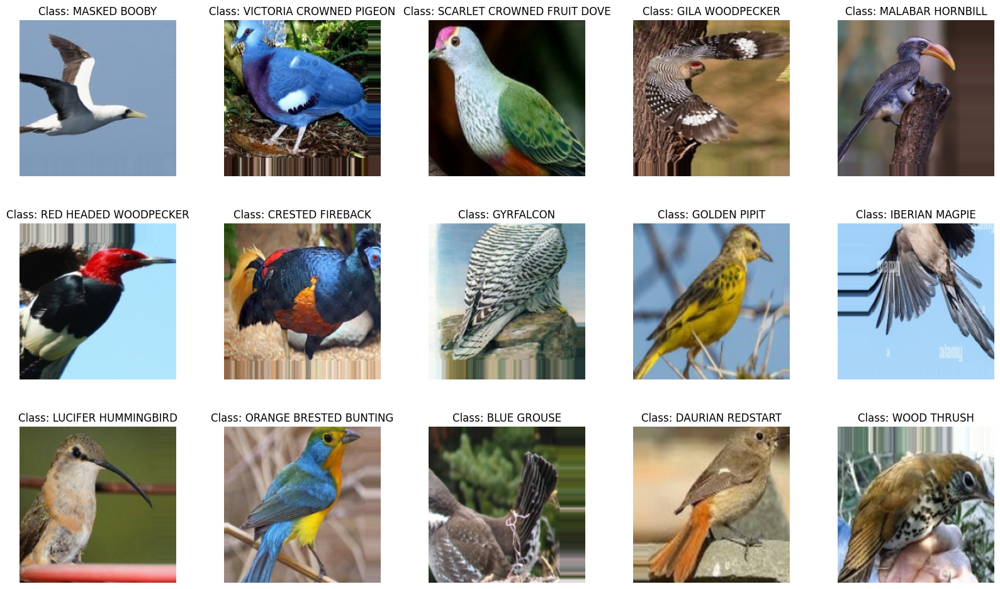

In [25]:
labels = [k for k in train_generator.class_indices]
sample_generate = train_generator.__next__()

images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(15):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i],axis=0)]}')
    plt.axis("off")

In [26]:
print(len(train_generator))
print(len(test_ds))
print(len(validation_ds))

2645
35
36


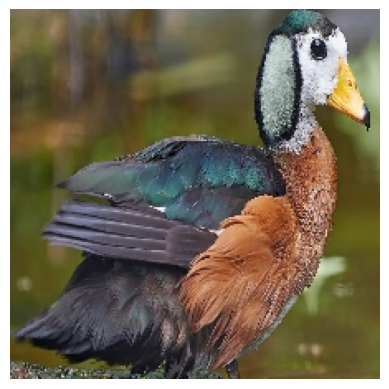

In [27]:
import matplotlib.pyplot as plt
from skimage import io

# Load image
img_url = "/kaggle/input/100-bird-species/train/AFRICAN PYGMY GOOSE/005.jpg"
img = io.imread(img_url)

# Display image
plt.imshow(img)
plt.axis('off')
plt.show()

In [28]:
from keras.layers import MaxPool2D

In [29]:
import numpy as np
from keras.layers import Dense,Flatten,Conv2D,Activation,Dropout

from keras import backend as K

import keras

from keras.models import Sequential, Model

from keras.models import load_model

from keras.optimizers import SGD

from keras.callbacks import EarlyStopping,ModelCheckpoint

from keras.layers import MaxPool2D

**Build MobileNet Model**

17225924/17225924 [==============================] - 1s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                            

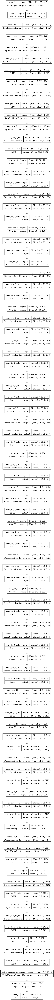

In [30]:
from keras.models import Model
from keras.layers import Input, Conv2D, GlobalAveragePooling2D, Dropout
from keras.layers import Activation, BatchNormalization
from keras.utils import plot_model
from keras.applications.mobilenet import MobileNet
def mobilenet(input_shape):
    input_tensor = Input(shape=input_shape)
    base_model = MobileNet(include_top=False, input_tensor=input_tensor)

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    x = Dense(525, activation='softmax')(x)

    model = Model(inputs=input_tensor, outputs=x)

    return model


input_shape = (224, 224, 3)
num_classes =525

model = mobilenet(input_shape)
model.summary()
plot_model(model, to_file='mobilenet.png', show_shapes=True)

In [31]:
model = mobilenet((224, 224, 3))

**Model summary**

In [32]:
# Print the model summary

model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128 

In [33]:
import keras
from keras.models import Sequential
from keras.layers import Dense

In [34]:
from keras.optimizers import Adam
opt = Adam(learning_rate=0.00001)
model.compile(optimizer=opt, loss=keras.losses.categorical_crossentropy, metrics=['accuracy'])

In [35]:
history = model.fit(train_generator, validation_data=test_generator, epochs=10)

Epoch 1/10
2645/2645 [==============================] - 1280s 478ms/step - loss: 6.4573 - accuracy: 0.0108 - val_loss: 5.1757 - val_accuracy: 0.1341
Epoch 2/10
2645/2645 [==============================] - 1218s 460ms/step - loss: 5.1968 - accuracy: 0.0802 - val_loss: 3.7155 - val_accuracy: 0.4168
Epoch 3/10
2645/2645 [==============================] - 1241s 469ms/step - loss: 4.1359 - accuracy: 0.2042 - val_loss: 2.5798 - val_accuracy: 0.6240
Epoch 4/10
2645/2645 [==============================] - 1246s 471ms/step - loss: 3.3263 - accuracy: 0.3276 - val_loss: 1.8499 - val_accuracy: 0.7467
Epoch 5/10
2645/2645 [==============================] - 1252s 473ms/step - loss: 2.7351 - accuracy: 0.4323 - val_loss: 1.3639 - val_accuracy: 0.8107
Epoch 6/10
2645/2645 [==============================] - 1255s 474ms/step - loss: 2.2885 - accuracy: 0.5173 - val_loss: 1.0481 - val_accuracy: 0.8442
Epoch 7/10
2645/2645 [==============================] - 1230s 465ms/step - loss: 1.9588 - accuracy: 0.5805

In [36]:
n_categories = len(os.listdir('/kaggle/input/100-bird-species/valid'))# number of categories print(n_categories)

In [37]:
n_categories

525

In [38]:
results =pd.DataFrame(history.history)
results.head()

,loss,accuracy,val_loss,val_accuracy
0,6.457285,0.010835,5.175748,0.134095
1,5.196816,0.080239,3.715471,0.416762
2,4.135914,0.204183,2.579816,0.624000
3,3.326330,0.327619,1.849880,0.746667
4,2.735095,0.432303,1.363862,0.810667


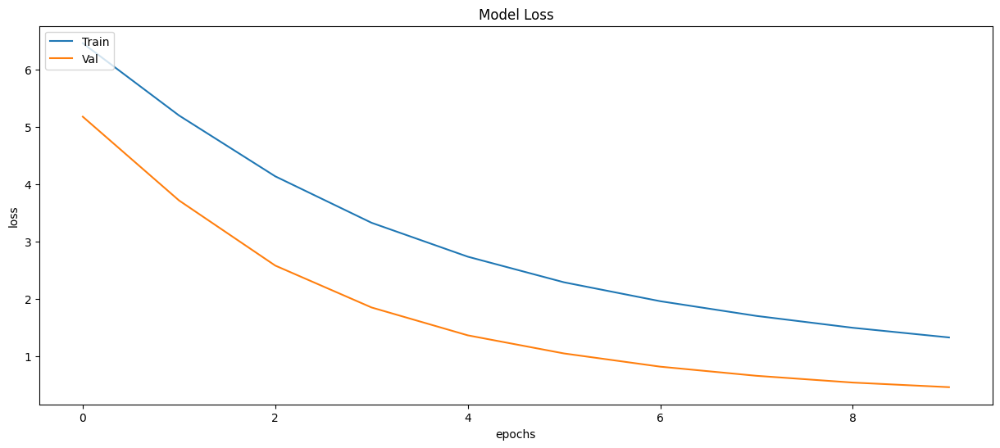

In [39]:
plt.figure(figsize=(15,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['Train','Val'], loc= 'upper left')
plt.show()

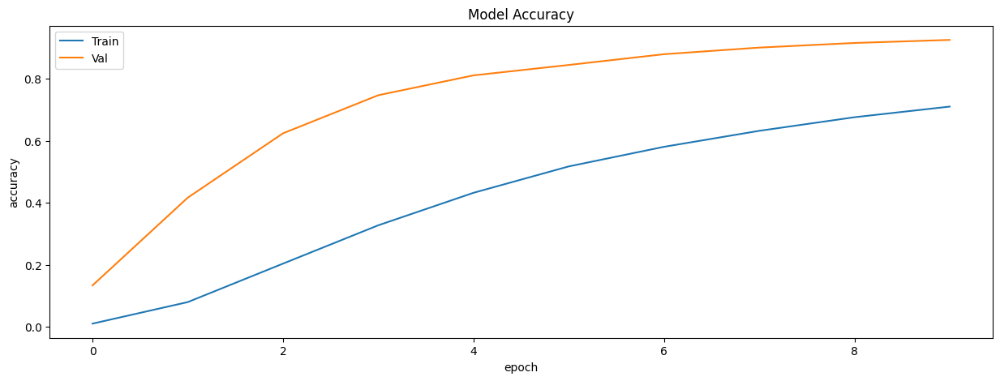

In [40]:
plt.figure(figsize=(15,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

In [41]:
y_test_1 = test_generator.classes
y_pred_1 = model.predict(test_generator)
y_pred_1 = np.argmax(y_pred_1,axis=1)

83/83 [==============================] - 6s 64ms/step


In [42]:
results = model.evaluate(test_generator)

83/83 [==============================] - 5s 63ms/step - loss: 0.4602 - accuracy: 0.9250


In [43]:
from sklearn.metrics import classification_report

print(classification_report(y_test_1, y_pred_1))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      0.20      0.33         5
           2       0.83      1.00      0.91         5
           3       1.00      1.00      1.00         5
           4       1.00      0.80      0.89         5
           5       1.00      1.00      1.00         5
           6       0.83      1.00      0.91         5
           7       1.00      0.20      0.33         5
           8       1.00      1.00      1.00         5
           9       0.80      0.80      0.80         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         5
          12       1.00      0.80      0.89         5
          13       1.00      0.60      0.75         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.00         5
          17       0.75    

1/1 [==============================] - 1s 612ms/step


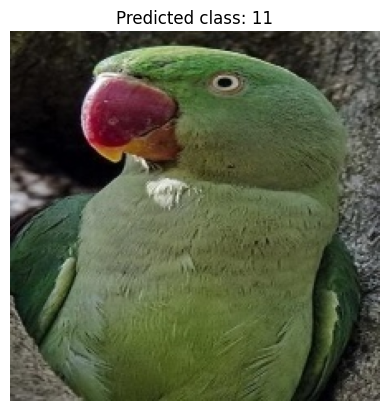

In [44]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

image_directory = '/kaggle/input/100-bird-species/valid/ALEXANDRINE PARAKEET'
img_size = 224

images = [] 
for filename in os.listdir(image_directory):
    path = os.path.join(image_directory, filename)
    img = Image.open(path)
    img = img.resize((img_size, img_size))
    images.append(img)

images = np.array([np.array(img) for img in images])
images = images / 255.0

predictions = model.predict(images)

# Select image to display
img_index = 0

# Get predicted class label
class_label = np.argmax(predictions[img_index])

# Display image and predicted class label
plt.imshow(images[img_index])
plt.axis('off')
plt.title('Predicted class: ' + str(class_label))
plt.show()

In [45]:
for i in range(len(images)):
    predicted_class = np.argmax(predictions[i])
    class_probability = predictions[i, predicted_class]
    print(f'Predicted class for {i+1}.jpg : {labels[predicted_class]}')
    print('Class probability:', class_probability)

Predicted class for 1.jpg : ALEXANDRINE PARAKEET
Class probability: 0.787209
Predicted class for 2.jpg : ALEXANDRINE PARAKEET
Class probability: 0.98281705
Predicted class for 3.jpg : ALEXANDRINE PARAKEET
Class probability: 0.9393697
Predicted class for 4.jpg : ALEXANDRINE PARAKEET
Class probability: 0.9612453
Predicted class for 5.jpg : ALEXANDRINE PARAKEET
Class probability: 0.9834449


# 3. VGG-16

In [46]:
import numpy as np 
import pandas as pd 
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, GlobalAveragePooling2D, Dropout, Flatten
from tensorflow.keras.applications import VGG16
import matplotlib.pyplot as plt
import seaborn as sns

In [47]:
train_ds="/kaggle/input/100-bird-species/train"
test_ds="/kaggle/input/100-bird-species/test"
validation_ds="/kaggle/input/100-bird-species/valid"

**Data preprocessing**

In [48]:
os.listdir('/kaggle/input/100-bird-species/train')

['DALMATIAN PELICAN',
 'BLACK BREASTED PUFFBIRD',
 'WATTLED CURASSOW',
 'AMERICAN WIGEON',
 'CARMINE BEE-EATER',
 'GAMBELS QUAIL',
 'UMBRELLA BIRD',
 'AMERICAN KESTREL',
 'AMERICAN GOLDFINCH',
 'BLUE GROSBEAK',
 'PALM NUT VULTURE',
 'DUSKY LORY',
 'AUCKLAND SHAQ',
 'BLACK THROATED WARBLER',
 'YELLOW CACIQUE',
 'STRIPPED SWALLOW',
 'VERMILION FLYCATHER',
 'CAPE MAY WARBLER',
 'RED TAILED HAWK',
 'GURNEYS PITTA',
 'INDIAN ROLLER',
 'SNOW GOOSE',
 'GREEN WINGED DOVE',
 'AZURE TANAGER',
 'GREEN MAGPIE',
 'BANDED BROADBILL',
 'AFRICAN PYGMY GOOSE',
 'INDIGO FLYCATCHER',
 'GREY PLOVER',
 'TOUCHAN',
 'HYACINTH MACAW',
 'HARLEQUIN DUCK',
 'ABYSSINIAN GROUND HORNBILL',
 'CALIFORNIA QUAIL',
 'BALD IBIS',
 'WOOD THRUSH',
 'RUBY THROATED HUMMINGBIRD',
 'INDIGO BUNTING',
 'ALBERTS TOWHEE',
 'SORA',
 'HOODED MERGANSER',
 'ROSEATE SPOONBILL',
 'CAPE ROCK THRUSH',
 'BLUE COAU',
 'CALIFORNIA CONDOR',
 'BORNEAN PHEASANT',
 'BARN SWALLOW',
 'TAIWAN MAGPIE',
 'SPLENDID WREN',
 'RED BILLED TROPICBIRD',
 'B

In [49]:
batch_size=32
img_size=224

In [50]:
train_datagen = ImageDataGenerator(rescale=1/255.,
                             zoom_range=0.2,
                            width_shift_range=0.2,height_shift_range=0.2
                             )

val_datagen = ImageDataGenerator(rescale=1/255.)

test_datagen = ImageDataGenerator(rescale=1/255.)

train_generator = train_datagen.flow_from_directory(train_ds,  
                                                target_size=(img_size, img_size), 
                                                batch_size=batch_size,
                                                shuffle=True,
                                                class_mode='categorical')  

validation_generator = val_datagen.flow_from_directory(validation_ds,
                                                    target_size=(img_size, img_size),
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(test_ds,
                                                    target_size=(img_size, img_size),
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    class_mode='categorical')

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [51]:
train_generator[0][0].shape

(32, 224, 224, 3)

In [52]:
img= train_generator[0]
print(img)

(array([[[[0.29342172, 0.45237234, 0.31128967],
         [0.29342172, 0.45237234, 0.31128967],
         [0.29342172, 0.45237234, 0.31128967],
         ...,
         [0.18823531, 0.37647063, 0.227451  ],
         [0.18823531, 0.37647063, 0.227451  ],
         [0.18823531, 0.37647063, 0.227451  ]],

        [[0.3851825 , 0.5280353 , 0.41529784],
         [0.3851825 , 0.5280353 , 0.41529784],
         [0.3851825 , 0.5280353 , 0.41529784],
         ...,
         [0.18823531, 0.37647063, 0.227451  ],
         [0.18823531, 0.37647063, 0.227451  ],
         [0.18823531, 0.37647063, 0.227451  ]],

        [[0.51274604, 0.63676554, 0.56127554],
         [0.51274604, 0.63676554, 0.56127554],
         [0.51274604, 0.63676554, 0.56127554],
         ...,
         [0.18823531, 0.37647063, 0.227451  ],
         [0.18823531, 0.37647063, 0.227451  ],
         [0.18823531, 0.37647063, 0.227451  ]],

        ...,

        [[0.14509805, 0.26666668, 0.13333334],
         [0.14509805, 0.26666668, 0.13333334

In [53]:
type(train_generator)

keras.src.preprocessing.image.DirectoryIterator

In [54]:
img = train_generator[0]
print(img[0].shape) # shape of the input batch
print(img[1].shape) # shape of the target labels

(32, 224, 224, 3)
(32, 525)


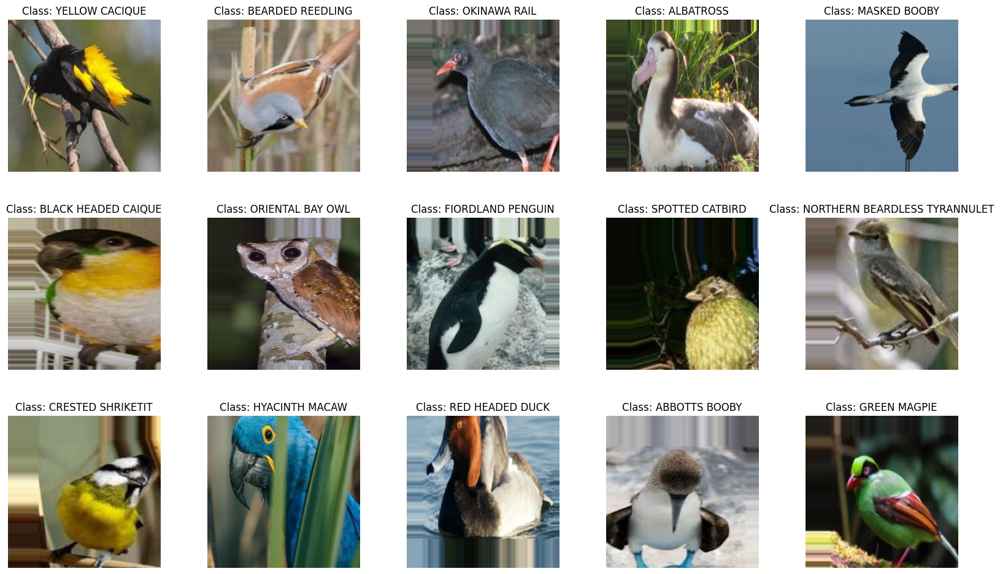

In [55]:
labels = [k for k in train_generator.class_indices]
sample_generate = train_generator.__next__()

images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(15):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i],axis=0)]}')
    plt.axis("off")

In [56]:
print(len(train_generator))
print(len(test_ds))
print(len(validation_ds))

2645
35
36


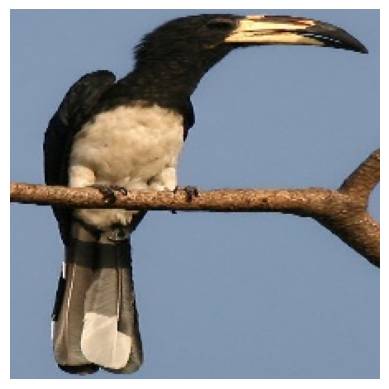

In [57]:
import matplotlib.pyplot as plt
from skimage import io

# Load image
img_url = "/kaggle/input/100-bird-species/train/AFRICAN PIED HORNBILL/008.jpg"
img = io.imread(img_url)

# Display image
plt.imshow(img)
plt.axis('off')
plt.show()

In [58]:
from keras.layers import MaxPool2D

In [59]:
import numpy as np
from keras.layers import Dense,Flatten,Conv2D,Activation,Dropout

from keras import backend as K

import keras

from keras.models import Sequential, Model

from keras.models import load_model

from keras.optimizers import SGD

from keras.callbacks import EarlyStopping,ModelCheckpoint

from keras.layers import MaxPool2D

**Build VGG_16 Model**

In [60]:
from keras.layers import MaxPool2D

In [61]:
model = Sequential()
model.add(Conv2D(input_shape=(224,224,3),filters=64,kernel_size=(3,3),padding="same", activation="relu"))
model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
model.add(Flatten())
model.add(Dense(units=4096,activation="relu"))
model.add(Dense(units=4096,activation="relu"))
model.add(Dense(units=525, activation="softmax"))

**Model summary**

In [62]:
# Print the model summary

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 224, 224, 64)      1792      
                                                                 
 conv2d_8 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 112, 112, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_10 (Conv2D)          (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 56, 56, 128)       0         
 g2D)                                                   

In [63]:
import keras
from keras.models import Sequential
from keras.layers import Dense

In [64]:
from keras.optimizers import Adam
opt = Adam(learning_rate=0.00001)
model.compile(optimizer=opt, loss=keras.losses.categorical_crossentropy, metrics=['accuracy'])

In [65]:
history =model.fit(train_generator, validation_data=test_generator, epochs=10)

Epoch 1/10
2645/2645 [==============================] - 1252s 470ms/step - loss: 5.8340 - accuracy: 0.0147 - val_loss: 5.0644 - val_accuracy: 0.0507
Epoch 2/10
2645/2645 [==============================] - 1238s 468ms/step - loss: 4.8313 - accuracy: 0.0846 - val_loss: 3.8303 - val_accuracy: 0.2088
Epoch 3/10
2645/2645 [==============================] - 1245s 471ms/step - loss: 4.0403 - accuracy: 0.1845 - val_loss: 3.1965 - val_accuracy: 0.3379
Epoch 4/10
2645/2645 [==============================] - 1213s 458ms/step - loss: 3.4746 - accuracy: 0.2728 - val_loss: 2.7960 - val_accuracy: 0.4179
Epoch 5/10
2645/2645 [==============================] - 1219s 461ms/step - loss: 3.0583 - accuracy: 0.3453 - val_loss: 2.4518 - val_accuracy: 0.5093
Epoch 6/10
2645/2645 [==============================] - 1229s 465ms/step - loss: 2.7127 - accuracy: 0.4036 - val_loss: 2.3912 - val_accuracy: 0.5509
Epoch 7/10
2645/2645 [==============================] - 1273s 481ms/step - loss: 2.4300 - accuracy: 0.4574

In [66]:
n_categories = len(os.listdir('/kaggle/input/100-bird-species/valid'))# number of categories print(n_categories)

In [67]:
n_categories

525

In [68]:
results =pd.DataFrame(history.history)
results.head()

,loss,accuracy,val_loss,val_accuracy
0,5.833981,0.014746,5.064378,0.050667
1,4.831319,0.084610,3.830320,0.208762
2,4.040268,0.184451,3.196497,0.337905
3,3.474627,0.272783,2.795950,0.417905
4,3.058348,0.345259,2.451814,0.509333


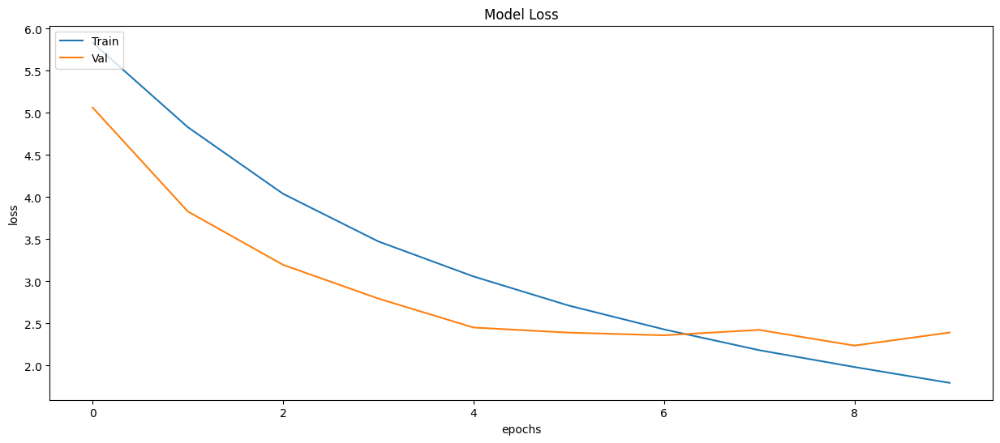

In [69]:
plt.figure(figsize=(15,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['Train','Val'], loc= 'upper left')
plt.show()

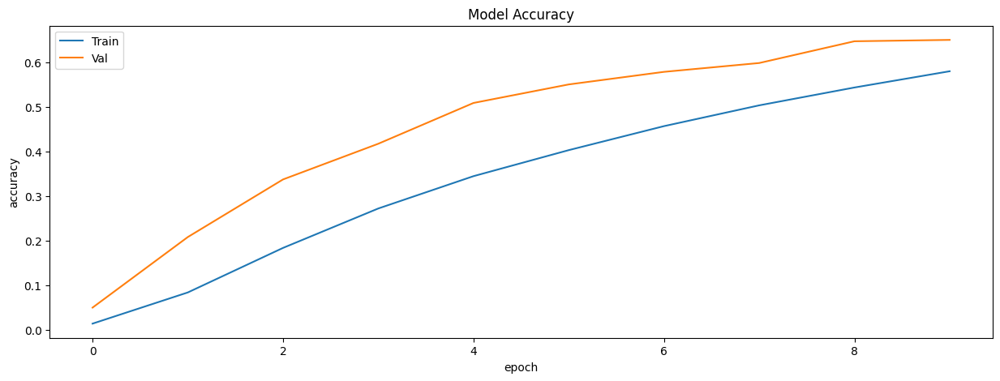

In [70]:
plt.figure(figsize=(15,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

In [71]:
y_test_1 = test_generator.classes
y_pred_1 =model.predict(test_generator)
y_pred_1 = np.argmax(y_pred_1,axis=1)

83/83 [==============================] - 6s 67ms/step


In [72]:
results =model.evaluate(test_generator)

83/83 [==============================] - 6s 68ms/step - loss: 2.3925 - accuracy: 0.6507


In [73]:
from sklearn.metrics import classification_report

print(classification_report(y_test_1, y_pred_1))

              precision    recall  f1-score   support

           0       0.67      0.40      0.50         5
           1       0.00      0.00      0.00         5
           2       0.50      0.60      0.55         5
           3       0.83      1.00      0.91         5
           4       1.00      0.40      0.57         5
           5       1.00      0.60      0.75         5
           6       1.00      0.80      0.89         5
           7       1.00      0.20      0.33         5
           8       0.67      0.80      0.73         5
           9       0.57      0.80      0.67         5
          10       0.67      0.40      0.50         5
          11       0.60      0.60      0.60         5
          12       1.00      0.20      0.33         5
          13       0.00      0.00      0.00         5
          14       0.67      0.80      0.73         5
          15       1.00      0.40      0.57         5
          16       0.60      0.60      0.60         5
          17       0.60    

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 [==============================] - 1s 658ms/step


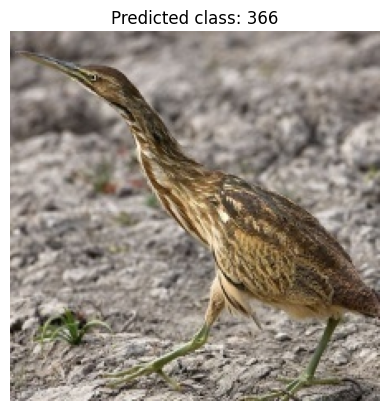

In [74]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

image_directory = '/kaggle/input/100-bird-species/valid/AMERICAN BITTERN'
img_size = 224

images = [] 
for filename in os.listdir(image_directory):
    path = os.path.join(image_directory, filename)
    img = Image.open(path)
    img = img.resize((img_size, img_size))
    images.append(img)

images = np.array([np.array(img) for img in images])
images = images / 255.0

predictions = model.predict(images)

# Select image to display
img_index = 0

# Get predicted class label
class_label = np.argmax(predictions[img_index])

# Display image and predicted class label
plt.imshow(images[img_index])
plt.axis('off')
plt.title('Predicted class: ' + str(class_label))
plt.show()

In [75]:
for i in range(len(images)):
    predicted_class = np.argmax(predictions[i])
    class_probability = predictions[i, predicted_class]
    print(f'Predicted class for {i+1}.jpg : {labels[predicted_class]}')
    print('Class probability:', class_probability)

Predicted class for 1.jpg : OILBIRD
Class probability: 1.0
Predicted class for 2.jpg : WOOD DUCK
Class probability: 1.0
Predicted class for 3.jpg : EARED PITA
Class probability: 1.0
Predicted class for 4.jpg : BLUE THROATED PIPING GUAN
Class probability: 1.0
Predicted class for 5.jpg : BLUE THROATED PIPING GUAN
Class probability: 1.0


# 4. ResNet50V2

**IMPORTS**

In [76]:
#from skimage import io
#import os

import tensorflow as tf
import keras
import numpy as np
import pandas as pd

import matplotlib as mpl
#import cv2
#import tensorflow_hub as hub

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import itertools
import pathlib
import PIL
import time
import datetime

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Layer, Flatten
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback

from sklearn.metrics import classification_report

**CUSTOM CALLBACK CLASSES**

In [77]:
# track training start time and number of epochs completed
class TrainingStatsCallback(Callback):  
    def on_train_begin(self, logs=None):  
        self.start_time = time.time()
        self.epochs_trained = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_trained += 1

**HELPER FUNCTIONS**

**Get data**

In [78]:
def get_data():
    #Get train test and valdation datasets
    train_ds="/kaggle/input/100-bird-species/train"
    validation_ds="/kaggle/input/100-bird-species/valid"
    test_ds="/kaggle/input/100-bird-species/test"  
    
    return train_ds, validation_ds, test_ds

**Get Training Time, Epochs and Plots**

In [79]:
def get_train_duration():
    #Calculate the training time and retrieve the number of epochs trained.
    duration_seconds = time.time() - training_stats_callback.start_time 
    duration = datetime.timedelta(seconds=duration_seconds)
    hours = duration.seconds // 3600
    minutes = (duration.seconds % 3600) // 60
    seconds = duration.seconds % 60
    
    epochs_trained = training_stats_callback.epochs_trained   
    return hours, minutes, seconds, epochs_trained

def show_training_plots(history): 
    # display a grid of the accuray and loss training plots
    mpl.rcParams['figure.figsize'] = (12, 10)
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    metrics = ['accuracy','loss']
    for n, metric in enumerate(metrics):
        name = metric.replace("_"," ").capitalize()
        plt.subplot(2,2,n+1)
        plt.plot(history.epoch[:len(history.history[metric])], history.history[metric], color=colors[1], label='Train')
        plt.plot(history.epoch[:len(history.history['val_'+metric])], history.history['val_'+metric],
                     color=colors[0], linestyle="--", label='Val')
        plt.xlabel('Epoch')
        plt.ylabel(name)

        plt.legend()

**Get Predictions**

In [80]:
def get_predictions(model,ds):
    #make predictions on the given dataset and print a classification report
    y_val = ds.classes
    y_pred = model.predict(ds)
    y_pred = np.argmax(y_pred,axis=1)
    class_indices = ds.class_indices
    indices = {v:k for k,v in class_indices.items()}
    filenames = ds.filenames
    print(classification_report(y_val,y_pred, zero_division=1))
    return indices, filenames, y_val, y_pred

def get_predictions_df(indices, filenames, y_val, y_pred):  
    #create a dataframe of predictions 
    test_df = pd.DataFrame()
    test_df['filename'] = filenames
    test_df['actual'] = y_val
    test_df['predicted'] = y_pred
    test_df['actual'] = test_df['actual'].apply(lambda x: indices[x])
    test_df['predicted'] = test_df['predicted'].apply(lambda x: indices[x])
    test_df.loc[test_df['actual']==test_df['predicted'],'Same'] = True
    test_df.loc[test_df['actual']!=test_df['predicted'],'Same'] = False
    test_df = test_df.sample(frac=1).reset_index(drop=True)
        # Write DataFrame to a CSV file
    test_df.to_csv('predictions.csv', index=False)  # Change the filename as desired
    print(test_df)
    return test_df

**Images**

In [81]:
def readImage(path):
    #load image, covert to NumPy array and normalise
    img = load_img(path,color_mode='rgb',target_size=(img_size,img_size))
    img = img_to_array(img)
    img = img/255.
    return img


def get_max_true_img():
    #returns the number of True predictions from test_df to display, MAX = 20
    max_true = len(test_df[test_df['Same']==True])
    if max_true > 20:
        max_true = 20 
    return max_true

def get_max_false_img():
    #returns the number of False predictions from test_df to display, MAX = 20
    max_true = len(test_df[test_df['Same']==False])
    if max_true > 20:
        max_true = 20 
    return max_true


def display_images(ds,temp_df, num_img):
    # display a grid of images from a dataframe with their actual and predicted lables 
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(num_img):
        n+=1
        plt.subplot(4 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = readImage(os.path.join(ds, temp_df.filename[i]))
        plt.imshow(image)
        plt.title(f'A: {temp_df.actual[i]} P: {temp_df.predicted[i]}')

**Grad-Cam**

In [82]:
#source code modified  from https://www.kaggle.com/code/quadeer15sh/grad-cam-what-do-cnns-see/notebook
def make_gradcam_heatmap(img_array, model, pred_index=None):
    
    grad_model = Model(inputs=model.inputs, outputs=[model.get_layer('conv5_block3_3_conv').output, model.output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), preds

def gradCAMImage(image):
    path = f"{test_ds}/{image}"
    img = readImage(path)
    img = np.expand_dims(img,axis=0)
    heatmap,preds = make_gradcam_heatmap(img,model)

    img = load_img(path)
    img = img_to_array(img)
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.jet

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * .8+ img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    
    return superimposed_img

def gradcam_of_images(correct_class):
    grad_images = []
    title = []
    temp_df = test_df[test_df['Same']==correct_class]
    temp_df = temp_df.reset_index(drop=True)
    
    if temp_df.empty:
        print(f"No {correct_class} predictions were made.")
        return grad_images, title
    
    for i in range(25):
        image = temp_df.filename[i]
        grad_image = gradCAMImage(image)
        grad_images.append(grad_image)
        title.append(f"A: {temp_df.actual[i]} P: {temp_df.predicted[i]}")

    return grad_images, title

def display_heatmaps(classified_images,titles,num_imgs):
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(num_imgs):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        plt.imshow(classified_images[i])
        plt.title(titles[i])
    plt.show()

**DATA PREPROCESSING**

In [83]:
#Get image data, set batch, image and class sizes
train_ds, validation_ds, test_ds = get_data()

batch_size=128 
img_size=224 
num_classes = 525

In [84]:
# Generate and preprocess batches of image data from the train, validation and test datasets
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


train_generator = datagen.flow_from_directory(train_ds,
                                              target_size=(img_size, img_size), 
                                              batch_size=batch_size,
                                              shuffle=True,
                                              class_mode='categorical'
                                             )  

validation_generator = datagen.flow_from_directory(validation_ds,
                                                   target_size=(img_size, img_size),
                                                   batch_size=batch_size,
                                                   shuffle=False,
                                                   class_mode='categorical'
                                                  )

test_generator =datagen.flow_from_directory(test_ds,
                                            target_size=(img_size, img_size),
                                            batch_size=batch_size,
                                            shuffle=False,
                                            class_mode='categorical'
                                           )

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [85]:
#Check data type/shape
img= train_generator[0]
print(f'Train data type: {type(train_generator)}')
print(f'Train data shape: {train_generator[0][0].shape}')
print(f'Train classes: {img[1].shape}')

img= validation_generator[0]
print(f'\nValid. data type: {type(validation_generator)}')
print(f'Valid. data shape: {train_generator[0][0].shape}')
print(f'Valid. classes: {img[1].shape}')

img= test_generator[0]
print(f'\nTest data type: {type(test_generator)}')
print(f'Test data shape: {train_generator[0][0].shape}')
print(f'Test classes: {img[1].shape}')

Train data type: <class 'keras.src.preprocessing.image.DirectoryIterator'>
Train data shape: (128, 224, 224, 3)
Train classes: (128, 525)

Valid. data type: <class 'keras.src.preprocessing.image.DirectoryIterator'>
Valid. data shape: (128, 224, 224, 3)
Valid. classes: (128, 525)

Test data type: <class 'keras.src.preprocessing.image.DirectoryIterator'>
Test data shape: (128, 224, 224, 3)
Test classes: (128, 525)


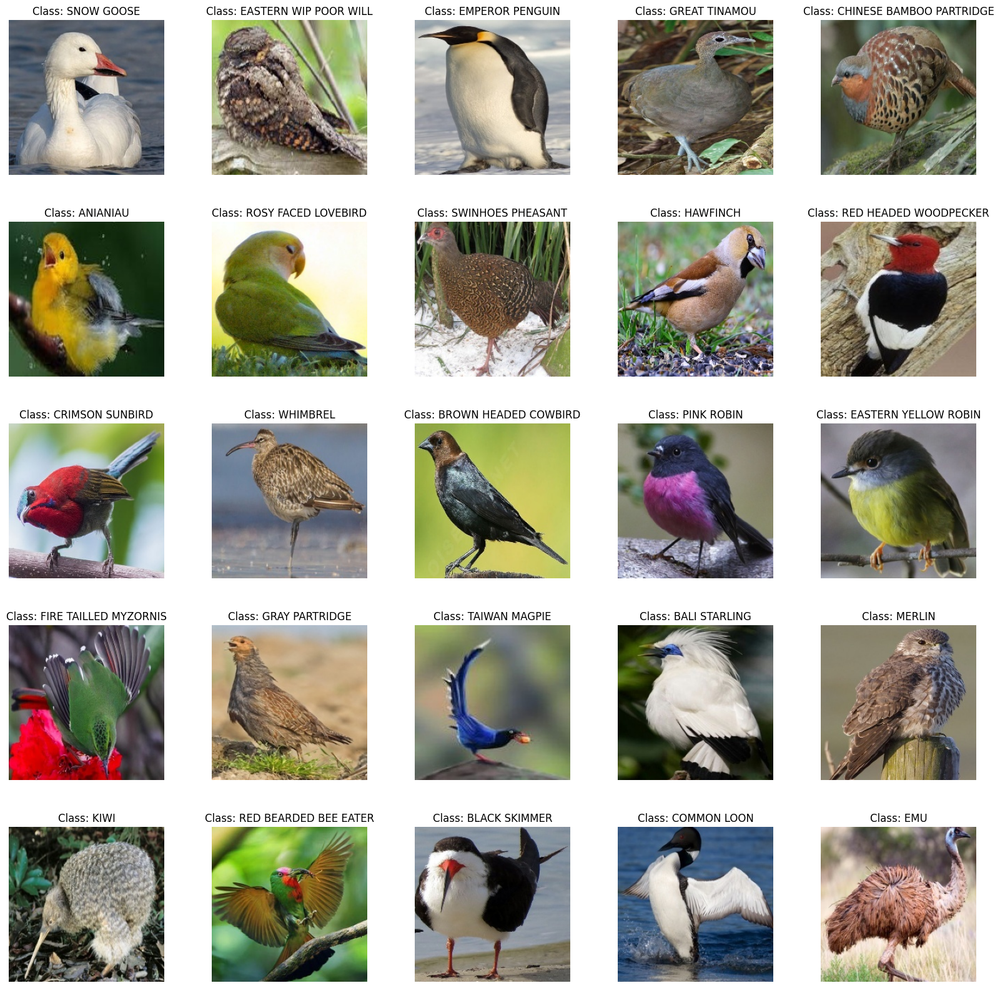

In [86]:
# Display a grid of 25 sample training images with corresponding class labels.
labels = [k for k in train_generator.class_indices]
sample_generate = train_generator.__next__()

images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(25):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i],axis=0)]}')
    plt.axis("off")

**TRANSFER LEARNING**

**DEFINE AND COMPILE MODEL (WITH FROZEN LAYERS)**

In [87]:
base_model = ResNet50V2(
    include_top = False,
    weights = 'imagenet',
    input_shape = (img_size,img_size,3)
)

for layer in base_model.layers:
    layer.trainable = False


last = base_model.output
x = GlobalAveragePooling2D()(last)
x = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=x)

model.compile(optimizer=keras.optimizers.Adam(0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#output model summary
model.summary()

#set model name
model_name = "ResNet50_525_Birds.h5"

94668760/94668760 [==============================] - 4s 0us/step
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                           

**DEFINE TRAINING PARAMETERS**

In [88]:
#Create a checkpoint to save the best model during training.
checkpoint = ModelCheckpoint(model_name,
                            monitor="val_loss",
                            mode="min",
                            save_best_only = True,
                            verbose=1)

# Create early stopping monitor for validation loss with patience of 3 epochs
earlystopping = EarlyStopping(monitor='val_loss',min_delta = 0, patience = 3, restore_best_weights=True, verbose = 1) 

# Create an instance of the TrainingStatsCallback
training_stats_callback = TrainingStatsCallback() 

# Create a list of callbacks
callbacks=[checkpoint,earlystopping, training_stats_callback]

**TRAIN MODEL**

In [89]:
# Train the model
#history = model.fit(train_generator,
history = model.fit(train_generator,
                    epochs=10,
                    validation_data=validation_generator,
                    callbacks=callbacks)

Epoch 1/10
662/662 [==============================] - ETA: 0s - loss: 4.1028 - accuracy: 0.3206
Epoch 1: val_loss improved from inf to 2.46275, saving model to ResNet50_525_Birds.h5


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


662/662 [==============================] - 247s 364ms/step - loss: 4.1028 - accuracy: 0.3206 - val_loss: 2.4627 - val_accuracy: 0.6450
Epoch 2/10
662/662 [==============================] - ETA: 0s - loss: 1.8994 - accuracy: 0.7174
Epoch 2: val_loss improved from 2.46275 to 1.41857, saving model to ResNet50_525_Birds.h5
662/662 [==============================] - 235s 355ms/step - loss: 1.8994 - accuracy: 0.7174 - val_loss: 1.4186 - val_accuracy: 0.7954
Epoch 3/10
662/662 [==============================] - ETA: 0s - loss: 1.2416 - accuracy: 0.8066
Epoch 3: val_loss improved from 1.41857 to 1.02104, saving model to ResNet50_525_Birds.h5
662/662 [==============================] - 235s 355ms/step - loss: 1.2416 - accuracy: 0.8066 - val_loss: 1.0210 - val_accuracy: 0.8434
Epoch 4/10
662/662 [==============================] - ETA: 0s - loss: 0.9429 - accuracy: 0.8462
Epoch 4: val_loss improved from 1.02104 to 0.81897, saving model to ResNet50_525_Birds.h5
662/662 [============================

**SAVE MODEL**

In [90]:
# Save the model and its weights
model.save('ResNet50_525_Birds.keras')
model.save('ResNet50_525_Birds.h5')
model.save_weights('ResNet50_525_Birds_weights.h5')

**TRAINING PLOTS FOR TRANSFER LEARNING**

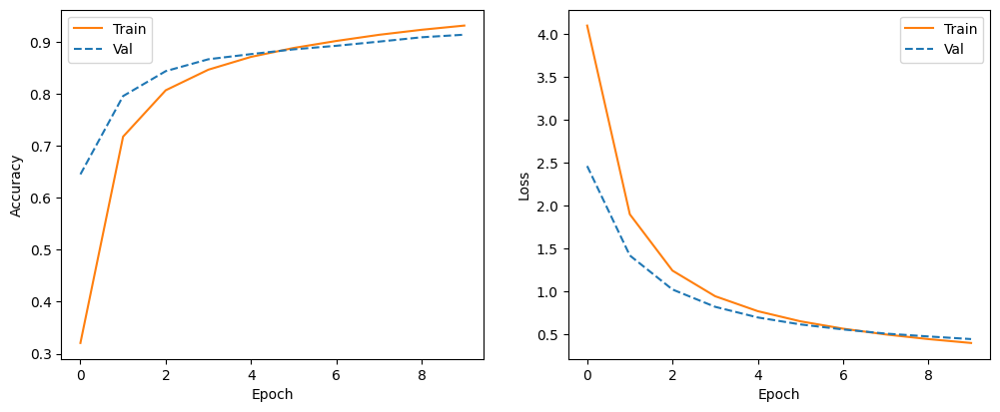

In [91]:
#Show training acuracy and loss plots
show_training_plots(history)

In [92]:
#Show training time/ number of epochs
hours, minutes, seconds, epochs_trained = get_train_duration()
print("Training Time: {} hours, {} minutes, {} seconds".format(hours, minutes, seconds))
print("Number of Epochs Trained:", epochs_trained)

Training Time: 0 hours, 40 minutes, 5 seconds
Number of Epochs Trained: 10


**MODEL EVALUATION AFTER TRANSFER LEARNING**

In [93]:
#Make predictions on test data
indices, filenames, y_val, y_pred = get_predictions(model,test_generator)
test_df = get_predictions_df(indices, filenames, y_val, y_pred)

21/21 [==============================] - 11s 472ms/step
              precision    recall  f1-score   support

           0       1.00      0.20      0.33         5
           1       0.80      0.80      0.80         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       0.60      0.60      0.60         5
           6       1.00      1.00      1.00         5
           7       1.00      0.80      0.89         5
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00         5
          10       1.00      1.00      1.00         5
          11       1.00      0.80      0.89         5
          12       0.75      0.60      0.67         5
          13       1.00      0.40      0.57         5
          14       1.00      0.80      0.89         5
          15       1.00      1.00      1.00         5
          16       1.00  

/tmp/ipykernel_47/3633500758.py:20: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  test_df.loc[test_df['actual']==test_df['predicted'],'Same'] = True


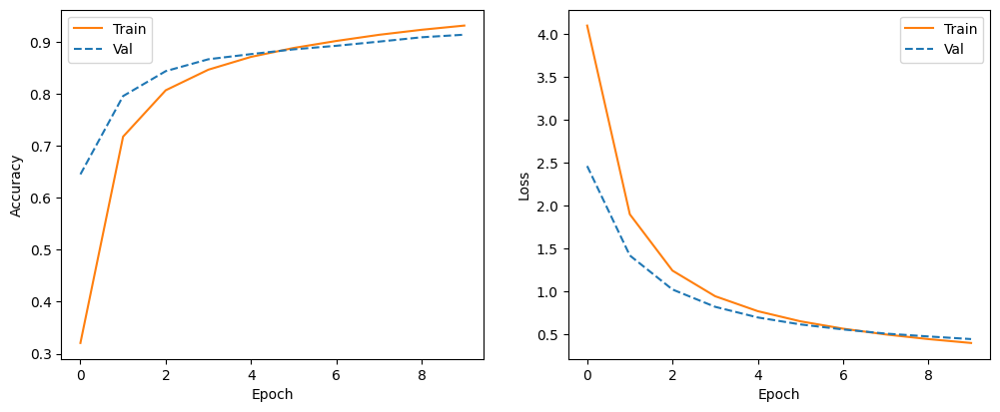

In [94]:
#Show training acuracy and loss plots
show_training_plots(history)

# 5. EfficientnetB5 Model

In [98]:
import cv2
img = cv2.imread("/kaggle/input/100-bird-species/train/ABBOTTS BABBLER/001.jpg")
img.shape

(224, 224, 3)

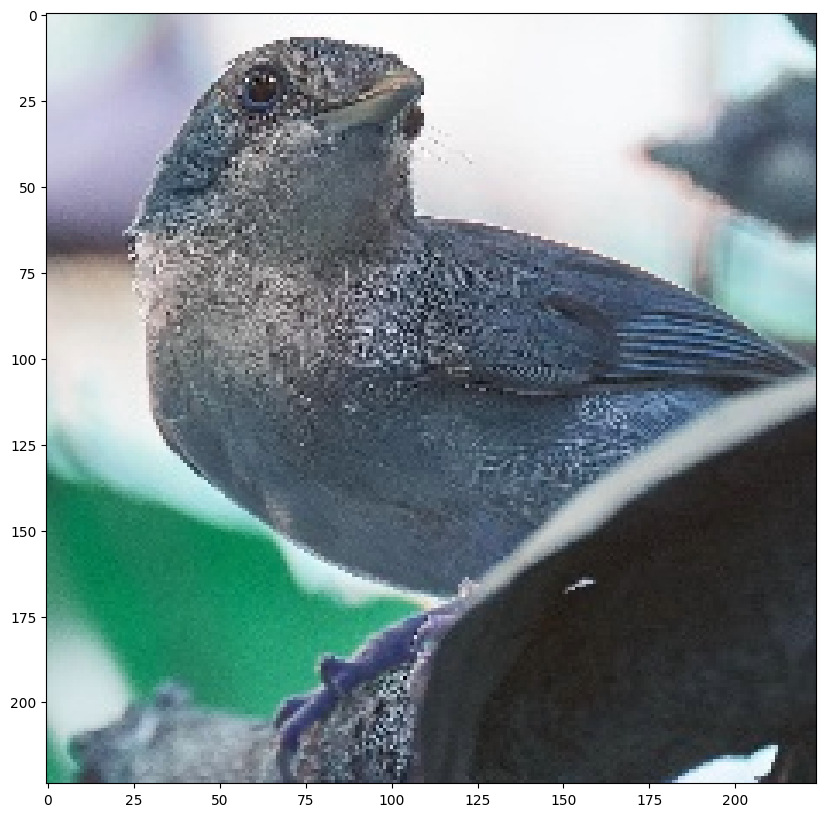

In [99]:
import matplotlib.pyplot as plt

plt.imshow(img)
plt.show()

**Data Preprocessing for Efficientnet**

In [100]:
train_dir = "../input/100-bird-species/train"
test_dir = "../input/100-bird-species/test"
val_dir = "../input/100-bird-species/valid"

In [101]:
import tensorflow as tf

train_data = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                     label_mode = "categorical",
                                                                     image_size = (224,224),
                                                                     batch_size = 32
                                                                     )
test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                    label_mode = "categorical",
                                                                    image_size = (224,224),
                                                                    batch_size = 32
                                                                    )
val_data = tf.keras.preprocessing.image_dataset_from_directory(val_dir,
                                                                   label_mode= "categorical",
                                                                   image_size = (224,224),
                                                                   batch_size = 32
                                                                   )

Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.


In [102]:
len(train_data.class_names)

525

In [103]:
labels_names = train_data.class_names

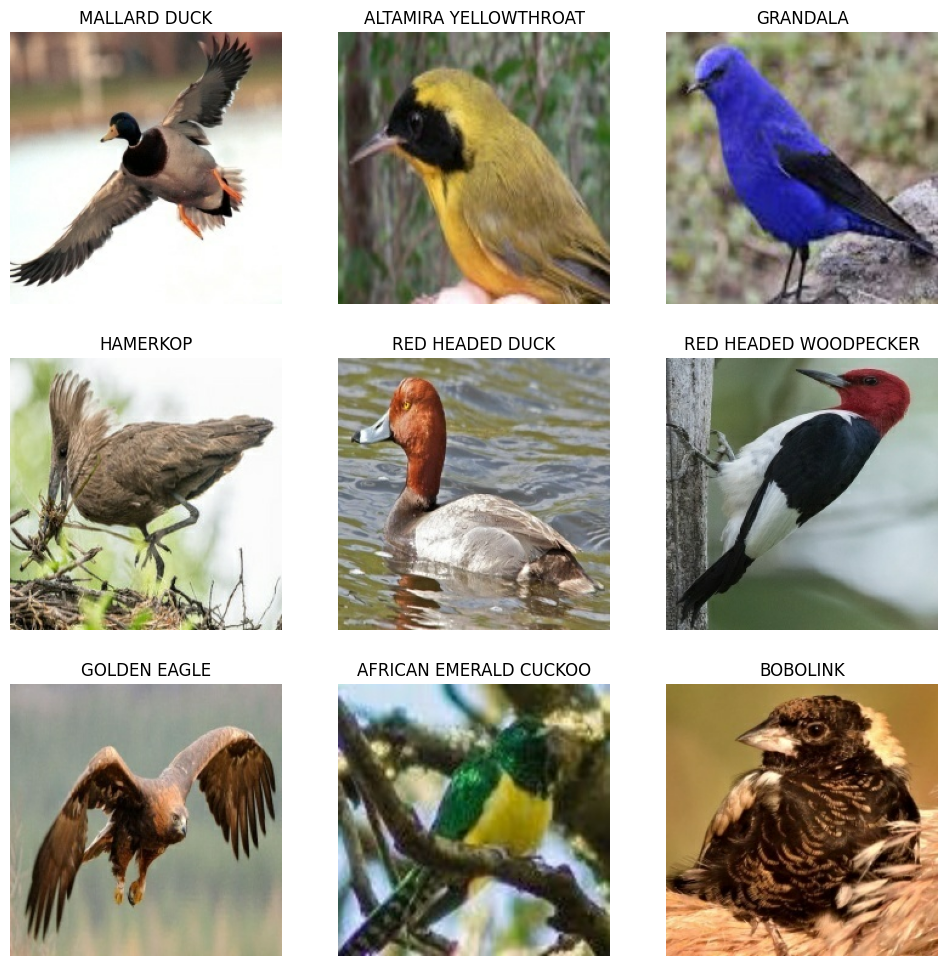

In [104]:
# visualizing the images
import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(12,12))
for image, label in train_data.take(1):
  
  for i in range(9):
    
    plt.subplot(3,3, i+1)  
    plt.imshow(image[i].numpy().astype("uint8"))
    plt.title(labels_names[tf.argmax(label[i])])
    plt.axis("off")

In [105]:
# building a efficientnet model
import tensorflow as tf

base_model = tf.keras.applications.EfficientNetB5(include_top= False, weights = "imagenet")

115263384/115263384 [==============================] - 5s 0us/step


In [110]:
import tensorflow as tf
from tensorflow.keras import layers

for layer in base_model.layers[:-5]:
  base_model.trainable = False


inputs = tf.keras.Input(shape=(224,224,3))

x = base_model(inputs)
x = layers.GlobalAveragePooling2D()(x)


outputs = layers.Dense(525, activation="softmax")(x)

eff_model = tf.keras.Model(inputs,outputs)

In [111]:
eff_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb5 (Functional  (None, None, None, 2048   28513527  
 )                           )                                   
                                                                 
 global_average_pooling2d_4  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 525)               1075725   
                                                                 
Total params: 29589252 (112.87 MB)
Trainable params: 1075725 (4.10 MB)
Non-trainable params: 28513527 (108.77 MB)
_________________________________________________________________


In [112]:
# compiling the model

eff_model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(learning_rate= 0.001),
    metrics = ["accuracy"]
)

In [113]:
# fitting data to the model

history = eff_model.fit(train_data,
              epochs = 10,
              steps_per_epoch = len(train_data),
              validation_data = val_data,
              validation_steps = len(val_data)
              )

Epoch 1/10


2023-11-17 15:34:23.741621: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/efficientnetb5/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2645/2645 [==============================] - 395s 143ms/step - loss: 1.0371 - accuracy: 0.8000 - val_loss: 0.2550 - val_accuracy: 0.9383
Epoch 2/10
2645/2645 [==============================] - 375s 142ms/step - loss: 0.3068 - accuracy: 0.9277 - val_loss: 0.1916 - val_accuracy: 0.9478
Epoch 3/10
2645/2645 [==============================] - 375s 142ms/step - loss: 0.1961 - accuracy: 0.9534 - val_loss: 0.1712 - val_accuracy: 0.9516
Epoch 4/10
2645/2645 [==============================] - 374s 141ms/step - loss: 0.1393 - accuracy: 0.9669 - val_loss: 0.1671 - val_accuracy: 0.9512
Epoch 5/10
2645/2645 [==============================] - 373s 141ms/step - loss: 0.1022 - accuracy: 0.9758 - val_loss: 0.1642 - val_accuracy: 0.9512
Epoch 6/10
2645/2645 [==============================] - 373s 141ms/step - loss: 0.0795 - accuracy: 0.9818 - val_loss: 0.1548 - val_accuracy: 0.9539
Epoch 7/10
2645/2645 [==============================] - 373s 141ms/step - loss: 0.0640 - accuracy: 0.9853 - val_loss: 0.157

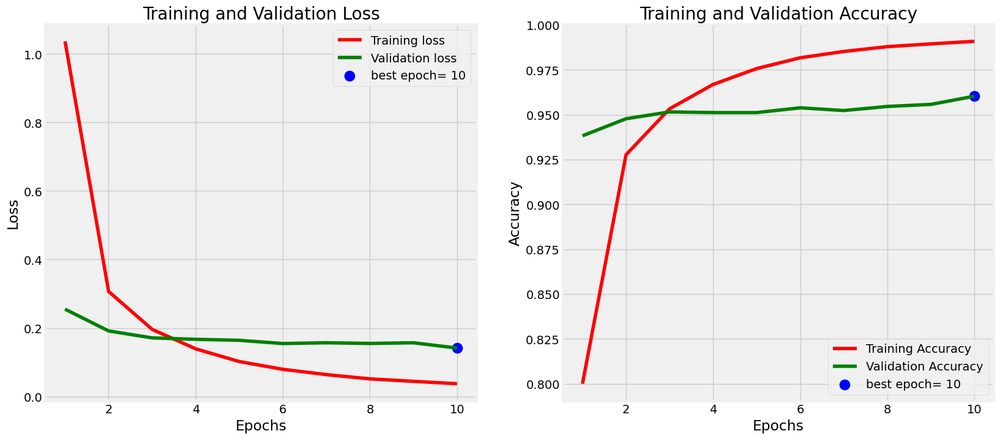

In [114]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'
# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')
plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout
plt.show()

In [115]:
eff_model_evaluation = eff_model.evaluate(test_data)

83/83 [==============================] - 11s 127ms/step - loss: 0.0831 - accuracy: 0.9768


In [116]:
print(f"Effcient Model Accuracy: {eff_model_evaluation[1]*100 : 0.2f}%")

Effcient Model Accuracy:  97.68%


In [117]:
# testing the model on test dataset

test_labels = test_data.class_names

len(test_labels)

525

1/1 [==============================] - 3s 3s/step


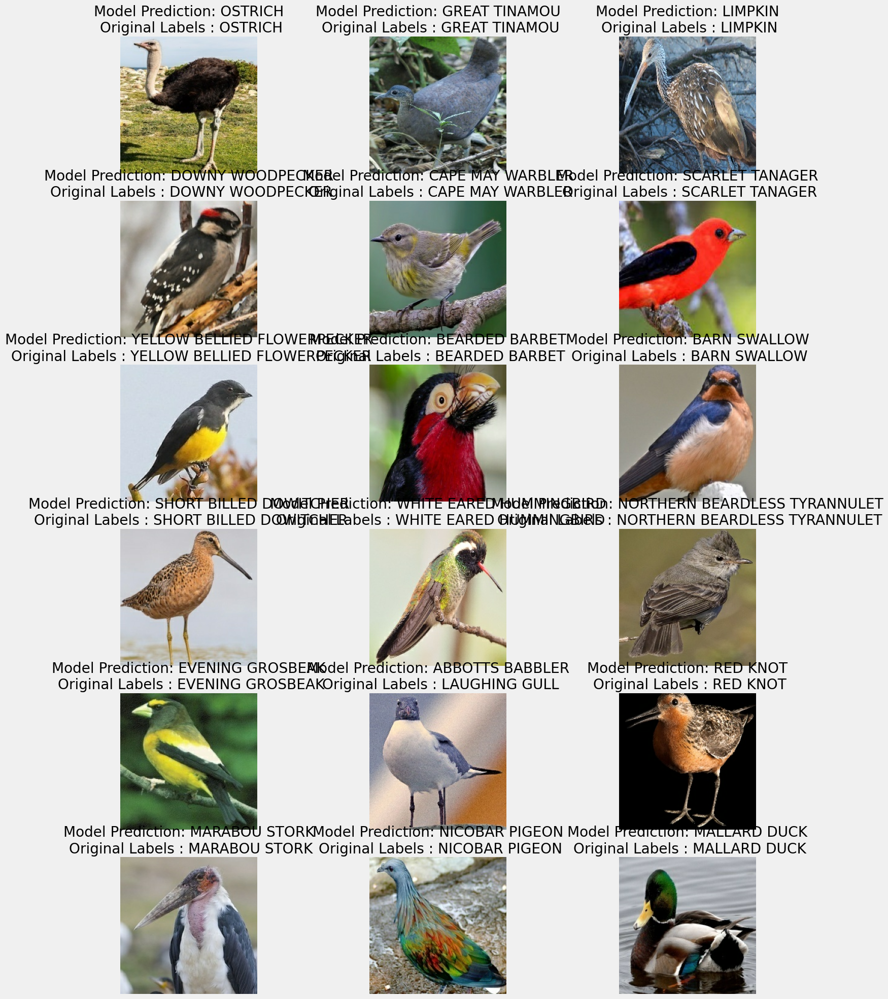

In [118]:
# predicting and visualizing the predicted images and class

import matplotlib.pyplot as plot
import tensorflow as tf

plt.figure(figsize=(16,16))

for image, label in test_data.take(1):
  model_prediction = eff_model.predict(image)
  for i in range(18):
    plt.subplot(6,3,i+1)
    plt.imshow(image[i].numpy().astype("uint8"))
    plt.title(f"Model Prediction: {test_labels[tf.argmax(tf.round(model_prediction[i]))]}\n Original Labels : {test_labels[tf.argmax(label[i])]}")
    plt.subplots_adjust(top=1.25)
    plt.axis("off")

# 6. EfficientnetB0 Model

In [119]:
!pip install tensorflow==2.9.1

     ━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.9/511.7 MB 10.0 MB/s eta 0:00:50
ERROR: Exception:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/pip/_vendor/urllib3/response.py", line 438, in _error_catcher
    yield
  File "/opt/conda/lib/python3.10/site-packages/pip/_vendor/urllib3/response.py", line 561, in read
    data = self._fp_read(amt) if not fp_closed else b""
  File "/opt/conda/lib/python3.10/site-packages/pip/_vendor/urllib3/response.py", line 527, in _fp_read
    return self._fp.read(amt) if amt is not None else self._fp.read()
  File "/opt/conda/lib/python3.10/site-packages/pip/_vendor/cachecontrol/filewrapper.py", line 90, in read
    data = self.__fp.read(amt)
  File "/opt/conda/lib/python3.10/http/client.py", line 466, in read
    s = self.fp.read(amt)
  File "/opt/conda/lib/python3.10/socket.py", line 705, in readinto
    return self._sock.recv_into(b)
  File "/opt/conda/lib/python3.10/ssl.py", line 1274, in recv_into
    return se

In [120]:
!pip install seaborn

In [121]:
# import system libs
import os
import time
import shutil
import pathlib
import itertools
from PIL import Image

# import data handling tools
# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers
# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


# Data Preprocessing

**Read data and store it in dataframe**

In [122]:
train_dir = '/kaggle/input/100-bird-species/train'
filepaths = []
labels = []

folds = os.listdir(train_dir)
for fold in folds:
    foldpath = os.path.join(train_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
train_df = pd.concat([Fseries, Lseries], axis= 1)

In [123]:
train_df

,filepaths,labels
0,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
1,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
2,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
3,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
4,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
...,...,...
84630,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE
84631,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE
84632,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE
84633,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE


In [124]:
valid_dir = '/kaggle/input/100-bird-species/valid'
filepaths = []
labels = []

folds = os.listdir(train_dir)
for fold in folds:
    foldpath = os.path.join(train_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
valid_df = pd.concat([Fseries, Lseries], axis= 1)

In [125]:
valid_df

,filepaths,labels
0,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
1,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
2,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
3,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
4,/kaggle/input/100-bird-species/train/DALMATIAN...,DALMATIAN PELICAN
...,...,...
84630,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE
84631,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE
84632,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE
84633,/kaggle/input/100-bird-species/train/GOLDEN EA...,GOLDEN EAGLE


In [126]:
# Generate  test data paths with labels
test_dir = '/kaggle/input/100-bird-species/test'
filepaths = []
labels = []

folds = os.listdir(test_dir)
for fold in folds:
    foldpath = os.path.join(test_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
test_df = pd.concat([Fseries, Lseries], axis= 1)

In [127]:
test_df

,filepaths,labels
0,/kaggle/input/100-bird-species/test/DALMATIAN ...,DALMATIAN PELICAN
1,/kaggle/input/100-bird-species/test/DALMATIAN ...,DALMATIAN PELICAN
2,/kaggle/input/100-bird-species/test/DALMATIAN ...,DALMATIAN PELICAN
3,/kaggle/input/100-bird-species/test/DALMATIAN ...,DALMATIAN PELICAN
4,/kaggle/input/100-bird-species/test/DALMATIAN ...,DALMATIAN PELICAN
...,...,...
2620,/kaggle/input/100-bird-species/test/GOLDEN EAG...,GOLDEN EAGLE
2621,/kaggle/input/100-bird-species/test/GOLDEN EAG...,GOLDEN EAGLE
2622,/kaggle/input/100-bird-species/test/GOLDEN EAG...,GOLDEN EAGLE
2623,/kaggle/input/100-bird-species/test/GOLDEN EAG...,GOLDEN EAGLE


**Create image data generator**

In [128]:
# crobed image size
batch_size = 32
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()
train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)
valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)

Found 84635 validated image filenames belonging to 525 classes.
Found 84635 validated image filenames belonging to 525 classes.
Found 2625 validated image filenames belonging to 525 classes.


**Show sample from train data**

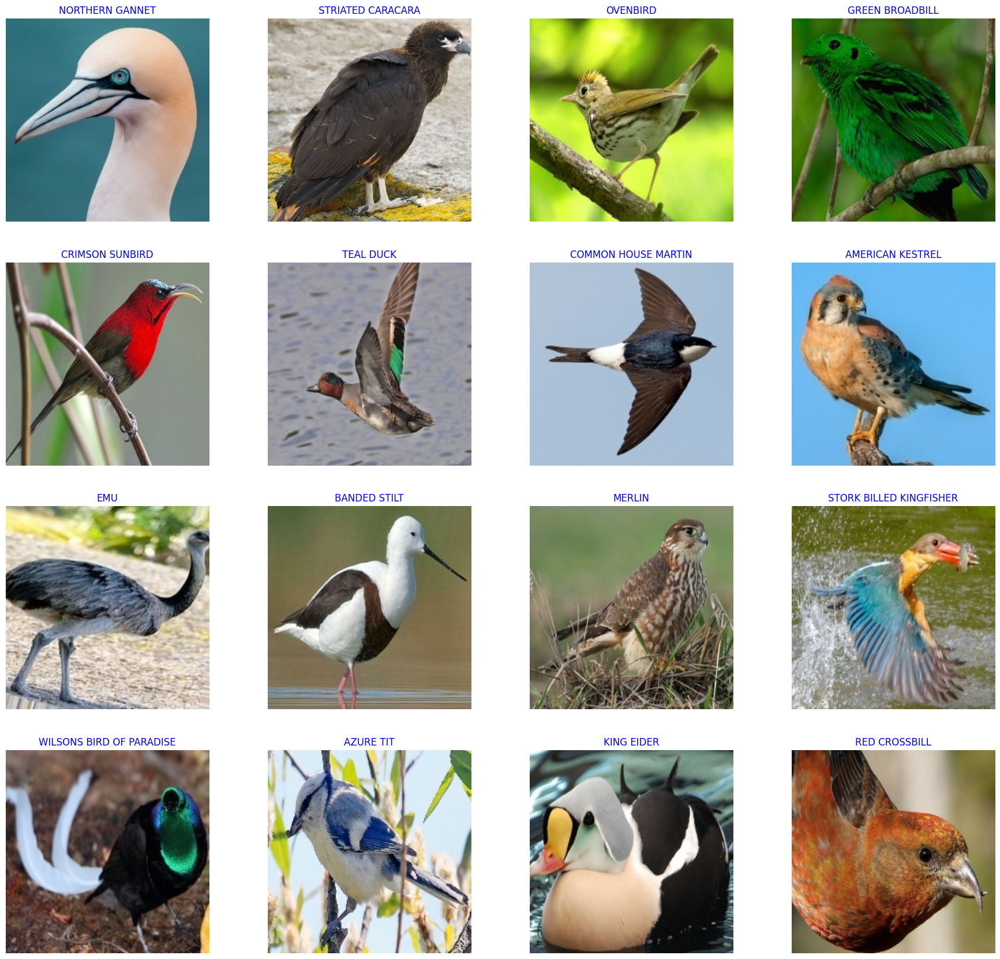

In [129]:
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.show()

# Model Structure

**Generic Model Creation**

In [130]:
# Create Model Structure
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

# create pre-trained model (you can built on pretrained model such as :  efficientnet, VGG , Resnet )
# we will use efficientnetb3 from EfficientNet family.
base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')
# base_model.trainable = False
model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123),
    Dense(class_count, activation= 'softmax')
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()

16705208/16705208 [==============================] - 1s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 1280)              4049571   
 )                                                               
                                                                 
 batch_normalization_11 (Ba  (None, 1280)              5120      
 tchNormalization)                                               
                                                                 
 dense_10 (Dense)            (None, 256)               327936    
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_11 (Dense)            (None, 525)               134925    
                                                       

**Train model**

In [ ]:
batch_size = 32   # set batch size for training
epochs =  10  # number of all epochs in training
history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen, 
                    validation_steps= None, shuffle= False)

Epoch 1/10


2023-11-17 16:38:34.820672: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/efficientnetb0/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2645/2645 [==============================] - 742s 267ms/step - loss: 5.0842 - accuracy: 0.5068 - val_loss: 2.1369 - val_accuracy: 0.8976
Epoch 2/10
2645/2645 [==============================] - 705s 266ms/step - loss: 2.1185 - accuracy: 0.8585 - val_loss: 1.4071 - val_accuracy: 0.9523
Epoch 3/10
2645/2645 [==============================] - 743s 281ms/step - loss: 1.5207 - accuracy: 0.9168 - val_loss: 1.0999 - val_accuracy: 0.9719
Epoch 4/10
2645/2645 [==============================] - 715s 270ms/step - loss: 1.2113 - accuracy: 0.9446 - val_loss: 0.9093 - val_accuracy: 0.9811
Epoch 5/10
1102/2645 [===========>..................] - ETA: 5:22 - loss: 1.0416 - accuracy: 0.9608

**Display model performance**

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'
# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')
plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout
plt.show()

# Evaluate model

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)
print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

**Get Predictions**

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

In [ ]:
y_pred

**Classification Report**

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')
    plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
# Classification report
print(classification_report(test_gen.classes, y_pred, target_names= classes))

**Save model**

In [ ]:
# Convert the model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TensorFlow Lite model to a file
with open('efficientnet.tflite', 'wb') as f:
    f.write(tflite_model)

In [ ]:
#Save the model
model.save('model.h5')

In [ ]:
import tensorflow as tf

# Convert the model
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir) # path to the SavedModel directory
tflite_model = converter.convert()

# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

# Prediction using loaded_model

In [ ]:
loaded_model = tf.keras.models.load_model('/kaggle/working/model.h5', compile=False)
loaded_model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

In [ ]:
image_path = '/kaggle/input/100-bird-species/test/ALPINE CHOUGH/4.jpg'
image = Image.open(image_path)

# Preprocess the image
img = image.resize((224, 224))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)

# Make predictions
predictions = loaded_model.predict(img_array)
class_labels = classes
score = tf.nn.softmax(predictions[0])
print(f"{class_labels[tf.argmax(score)]}")